<a href="https://colab.research.google.com/github/mehmoodosman/brain-tumor-classification/blob/main/brain_tumor_classification_with_neural_networks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# What is a brain tumor?

A brain tumor is a collection, or mass, of abnormal cells in your brain. Your skull, which encloses your brain, is very rigid. Any growth inside such a restricted space can cause problems. Brain tumors can be cancerous (malignant) or noncancerous (benign). When benign or malignant tumors grow, they can cause the pressure inside your skull to increase. This can cause brain damage, and it can be life-threatening.


## The importance of the subject

Early detection and classification of brain tumors is an important research domain in the field of medical imaging and accordingly helps in selecting the most convenient treatment method to save patients' lives.


## In this project

You will learn how to train neural networks to classify tumors in brain MRI scans. You will learn about how to construct different neural network architectures through transfer learning and custom convolutional layers, and use the Gemini 1.5 Flash model to generate explanations for the model's predictions.

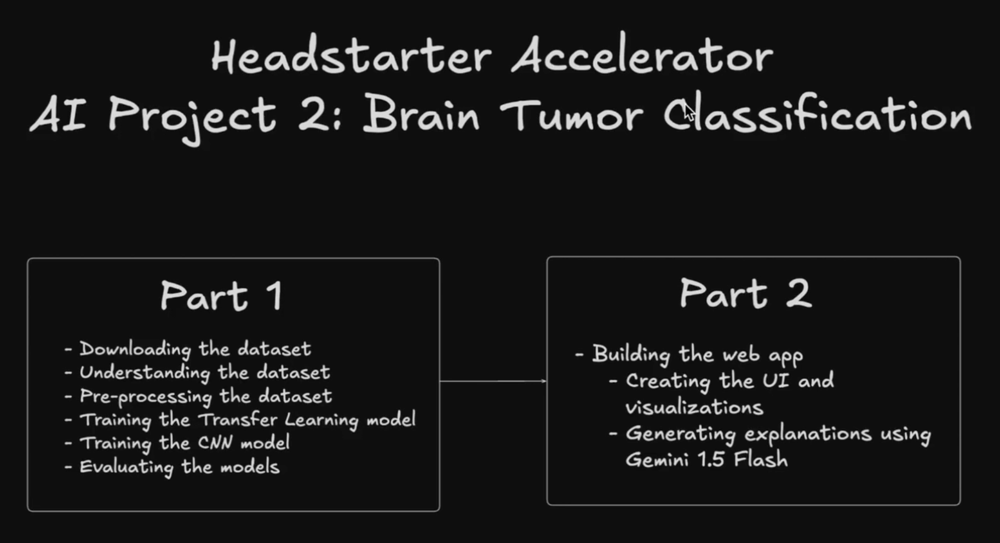

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
! kaggle datasets download -d masoudnickparvar/brain-tumor-mri-dataset --unzip

Dataset URL: https://www.kaggle.com/datasets/masoudnickparvar/brain-tumor-mri-dataset
License(s): CC0-1.0
 96% 143M/149M [00:01<00:00, 150MB/s]
100% 149M/149M [00:01<00:00, 138MB/s]


In [ ]:
def get_class_paths(path):
    classes = []
    class_paths = []

    # Iterate through directories in the training path
    for label in os.listdir(path):
        label_path = os.path.join(path, label)

        # Check if it's a directory
        if os.path.isdir(label_path):
            # Iterate through images in the label directory
            for image in os.listdir(label_path):
                image_path = os.path.join(label_path, image)

                # Add class and path to respective lists
                classes.append(label)
                class_paths.append(image_path)

    # Create a DataFrame with the collected data
    df = pd.DataFrame({
        'Class Path': class_paths,
        'Class': classes
    })

    return df

In [ ]:
tr_df = get_class_paths("/content/Training")

In [ ]:
tr_df

,Class Path,Class
0,/content/Training/meningioma/Tr-me_1245.jpg,meningioma
1,/content/Training/meningioma/Tr-me_0590.jpg,meningioma
2,/content/Training/meningioma/Tr-me_0153.jpg,meningioma
3,/content/Training/meningioma/Tr-me_0130.jpg,meningioma
4,/content/Training/meningioma/Tr-me_0024.jpg,meningioma
...,...,...
5707,/content/Training/pituitary/Tr-pi_1392.jpg,pituitary
5708,/content/Training/pituitary/Tr-pi_1049.jpg,pituitary
5709,/content/Training/pituitary/Tr-pi_0248.jpg,pituitary
5710,/content/Training/pituitary/Tr-pi_0790.jpg,pituitary


In [ ]:
ts_df = get_class_paths("/content/Testing")

In [ ]:
ts_df

,Class Path,Class
0,/content/Testing/meningioma/Te-me_0208.jpg,meningioma
1,/content/Testing/meningioma/Te-me_0151.jpg,meningioma
2,/content/Testing/meningioma/Te-me_0046.jpg,meningioma
3,/content/Testing/meningioma/Te-me_0112.jpg,meningioma
4,/content/Testing/meningioma/Te-me_0034.jpg,meningioma
...,...,...
1306,/content/Testing/pituitary/Te-pi_0140.jpg,pituitary
1307,/content/Testing/pituitary/Te-pi_0011.jpg,pituitary
1308,/content/Testing/pituitary/Te-pi_0269.jpg,pituitary
1309,/content/Testing/pituitary/Te-piTr_0007.jpg,pituitary


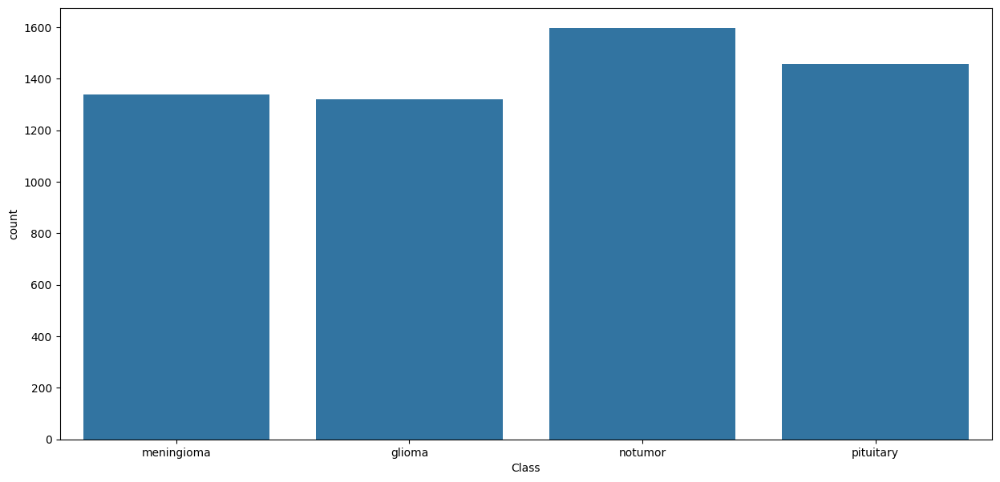

In [ ]:
plt.figure(figsize=(15, 7))
ax = sns.countplot(data=tr_df, x=tr_df['Class'])

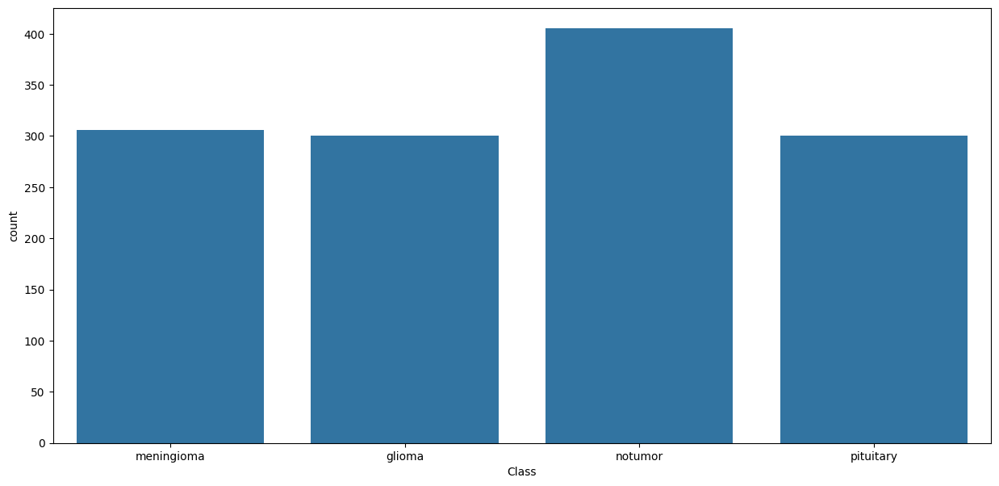

In [ ]:
plt.figure(figsize=(15, 7))
ax = sns.countplot(data=ts_df, x=ts_df['Class'])

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.metrics import Precision, Recall
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
valid_df, ts_df = train_test_split(ts_df, train_size = 0.5, stratify=ts_df['Class'])

In [ ]:
valid_df

,Class Path,Class
524,/content/Testing/glioma/Te-gl_0041.jpg,glioma
929,/content/Testing/notumor/Te-no_0189.jpg,notumor
293,/content/Testing/meningioma/Te-me_0246.jpg,meningioma
470,/content/Testing/glioma/Te-gl_0162.jpg,glioma
449,/content/Testing/glioma/Te-gl_0153.jpg,glioma
...,...,...
372,/content/Testing/glioma/Te-gl_0074.jpg,glioma
1061,/content/Testing/pituitary/Te-pi_0114.jpg,pituitary
274,/content/Testing/meningioma/Te-me_0182.jpg,meningioma
329,/content/Testing/glioma/Te-gl_0225.jpg,glioma


In [ ]:
ts_df

,Class Path,Class
49,/content/Testing/meningioma/Te-me_0187.jpg,meningioma
832,/content/Testing/notumor/Te-no_0112.jpg,notumor
1022,/content/Testing/pituitary/Te-pi_0072.jpg,pituitary
510,/content/Testing/glioma/Te-gl_0235.jpg,glioma
1108,/content/Testing/pituitary/Te-pi_0045.jpg,pituitary
...,...,...
154,/content/Testing/meningioma/Te-me_0049.jpg,meningioma
1280,/content/Testing/pituitary/Te-pi_0148.jpg,pituitary
400,/content/Testing/glioma/Te-gl_0260.jpg,glioma
629,/content/Testing/notumor/Te-no_0168.jpg,notumor


In [ ]:
batch_size = 32 # Adjust Batch Size to 16, 32, 64, 128

# Resize all images to consistent dimensions
img_size = (299, 299)

# Preprocess images by rescaling pixel values and adjusting their brightness randomly to make the model robust and generalized
image_generator = ImageDataGenerator(rescale=1/255, brightness_range=(0.8, 1.2))

# ts_gen = ImageDataGenerator(rescale=1/255)

In [ ]:
tr_gen = image_generator.flow_from_dataframe(tr_df, x_col='Class Path', y_col='Class', batch_size=batch_size, target_size=img_size)

valid_gen = image_generator.flow_from_dataframe(valid_df, x_col='Class Path', y_col='Class', batch_size=batch_size, target_size=img_size)

ts_gen = image_generator.flow_from_dataframe(ts_df, x_col='Class Path', y_col='Class', batch_size=batch_size, target_size=img_size, shuffle=False)

Found 5712 validated image filenames belonging to 4 classes.
Found 655 validated image filenames belonging to 4 classes.
Found 656 validated image filenames belonging to 4 classes.


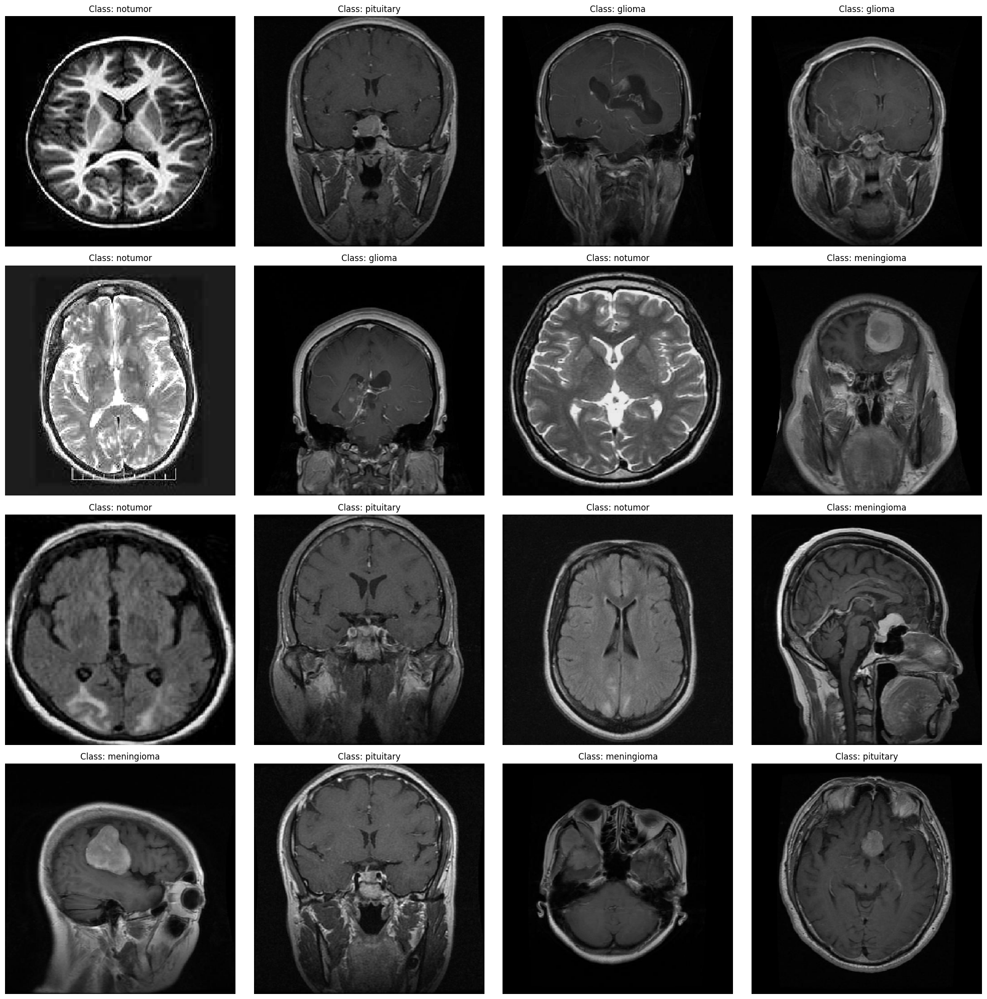

In [ ]:
plt.figure(figsize=(20, 20))
for i in range(16):
    plt.subplot(4, 4, i+1)
    batch = next(tr_gen)
    image = batch[0][0]
    label = batch[1][0]
    plt.imshow(image)

    # Get the class index
    class_index = np.argmax(label)

    # Get the list of class names and class indices
    class_names = list(tr_gen.class_indices.keys())
    class_indices = list(tr_gen.class_indices.values())

    # Find the index of the class_index in the list of indices
    index_position = class_indices.index(class_index)

    # Get the class name using the index position
    class_name = class_names[index_position]

    plt.title(f"Class: {class_name}")
    plt.axis('off')

plt.tight_layout()
plt.show()

# Xception Model

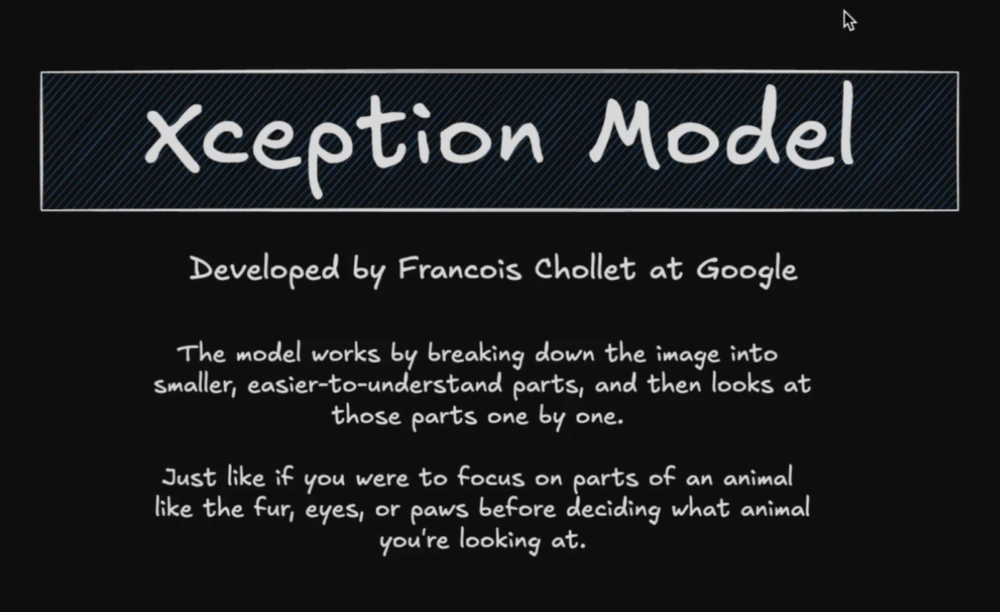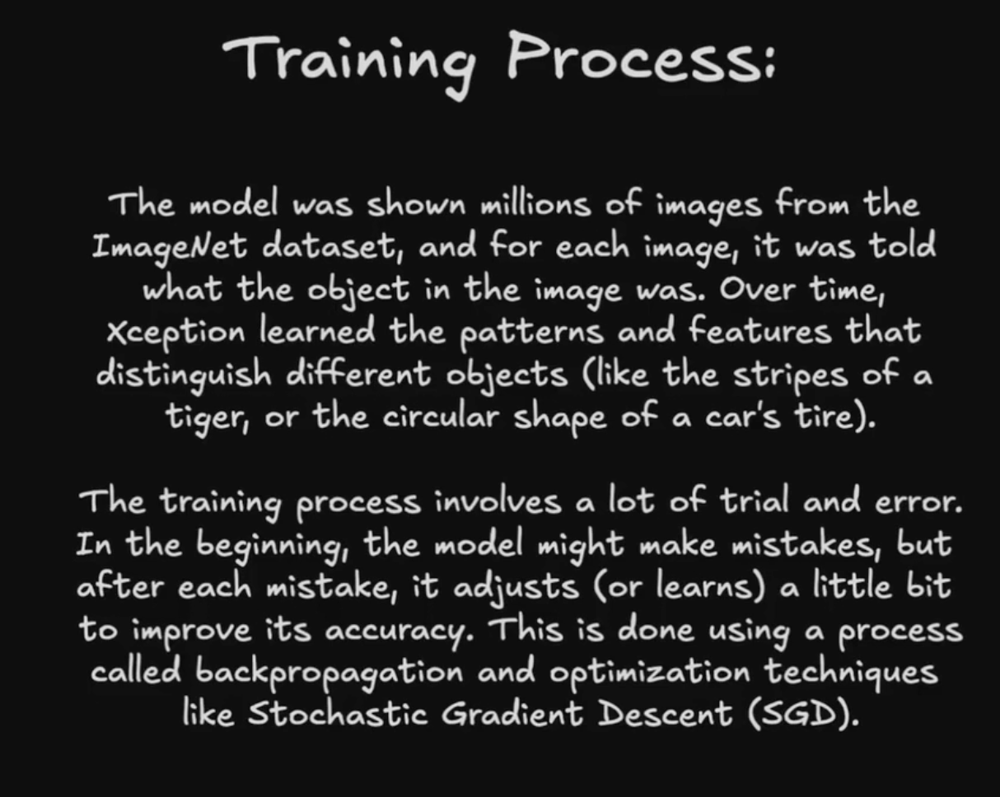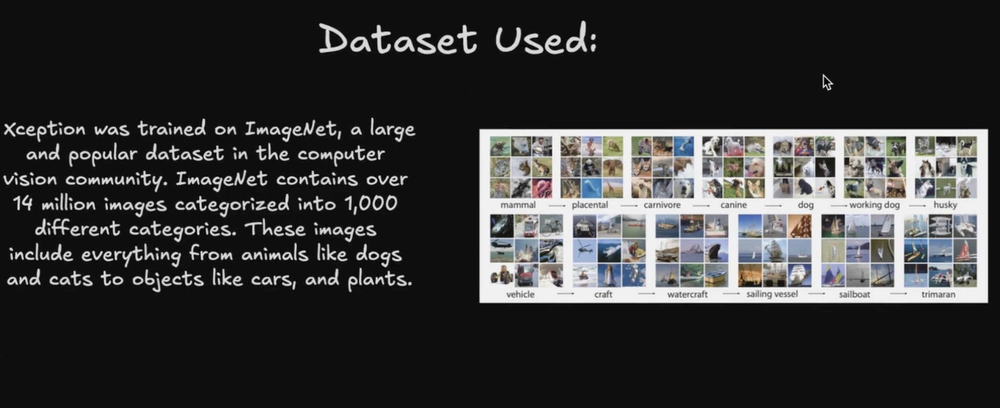

# Brain Tumor Classification with the Xception Model

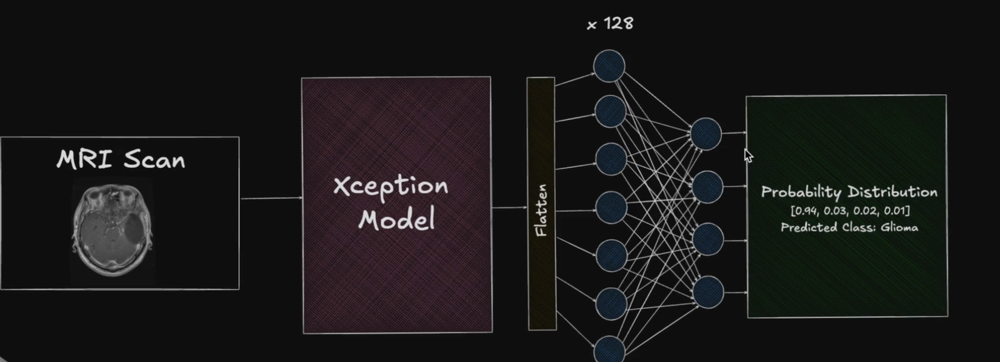

In [ ]:
img_shape = (299, 299, 3)

base_model = tf.keras.applications.Xception(include_top=False, weights="imagenet", input_shape=img_shape, pooling='max')

model = Sequential([
    base_model,
    Flatten(),
    Dropout(rate= 0.3),
    Dense(128, activation= 'relu'),
    Dropout(rate= 0.25),
    Dense(4, activation='softmax')
])

KeyboardInterrupt: 

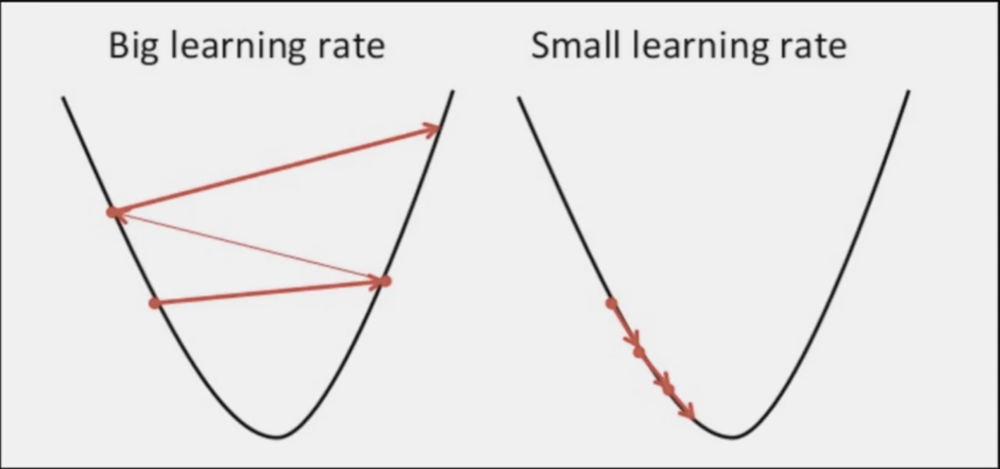

In [ ]:
model.compile(Adamax(learning_rate= 0.001),
              loss= 'categorical_crossentropy',
              metrics= ['accuracy',
              Precision(),
              Recall()])

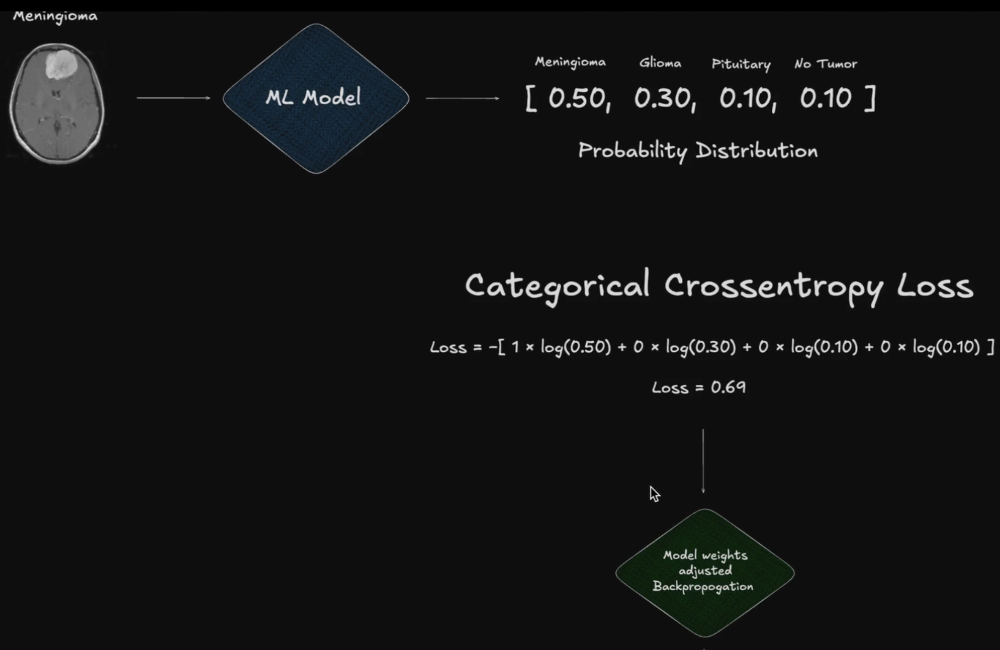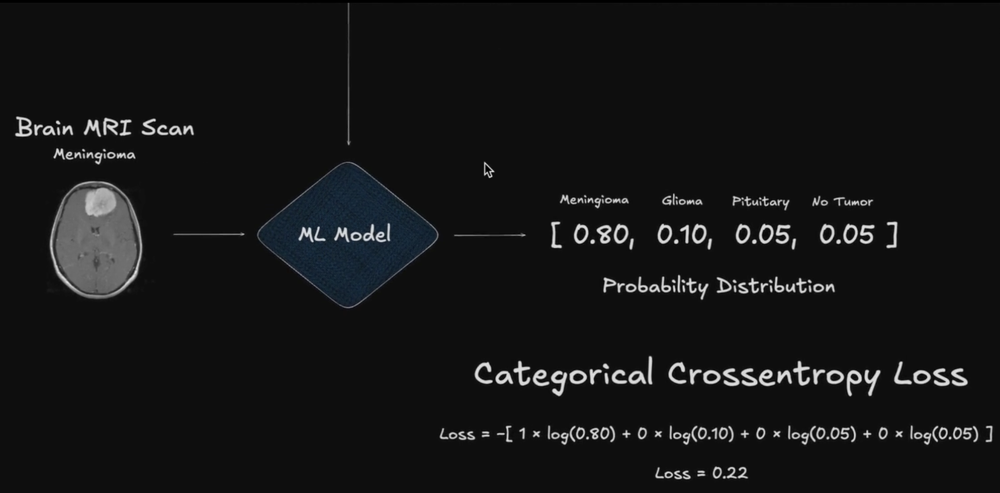

In [ ]:
hist = model.fit(tr_gen, epochs=5, validation_data=valid_gen)

Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


179/179 ━━━━━━━━━━━━━━━━━━━━ 277s 1s/step - accuracy: 0.8060 - loss: 0.5920 - precision: 0.8481 - recall: 0.7310 - val_accuracy: 0.9344 - val_loss: 0.1901 - val_precision: 0.9454 - val_recall: 0.9252
Epoch 2/5
179/179 ━━━━━━━━━━━━━━━━━━━━ 152s 812ms/step - accuracy: 0.9807 - loss: 0.0607 - precision: 0.9824 - recall: 0.9803 - val_accuracy: 0.9740 - val_loss: 0.0737 - val_precision: 0.9785 - val_recall: 0.9710
Epoch 3/5
179/179 ━━━━━━━━━━━━━━━━━━━━ 146s 809ms/step - accuracy: 0.9922 - loss: 0.0288 - precision: 0.9928 - recall: 0.9916 - val_accuracy: 0.9878 - val_loss: 0.0408 - val_precision: 0.9893 - val_recall: 0.9878
Epoch 4/5
179/179 ━━━━━━━━━━━━━━━━━━━━ 202s 811ms/step - accuracy: 0.9957 - loss: 0.0177 - precision: 0.9959 - recall: 0.9955 - val_accuracy: 0.9847 - val_loss: 0.0410 - val_precision: 0.9847 - val_recall: 0.9847
Epoch 5/5
179/179 ━━━━━━━━━━━━━━━━━━━━ 202s 813ms/step - accuracy: 0.9969 - loss: 0.0084 - precision: 0.9970 - recall: 0.9968 - val_accuracy: 0.9878 - val_loss: 

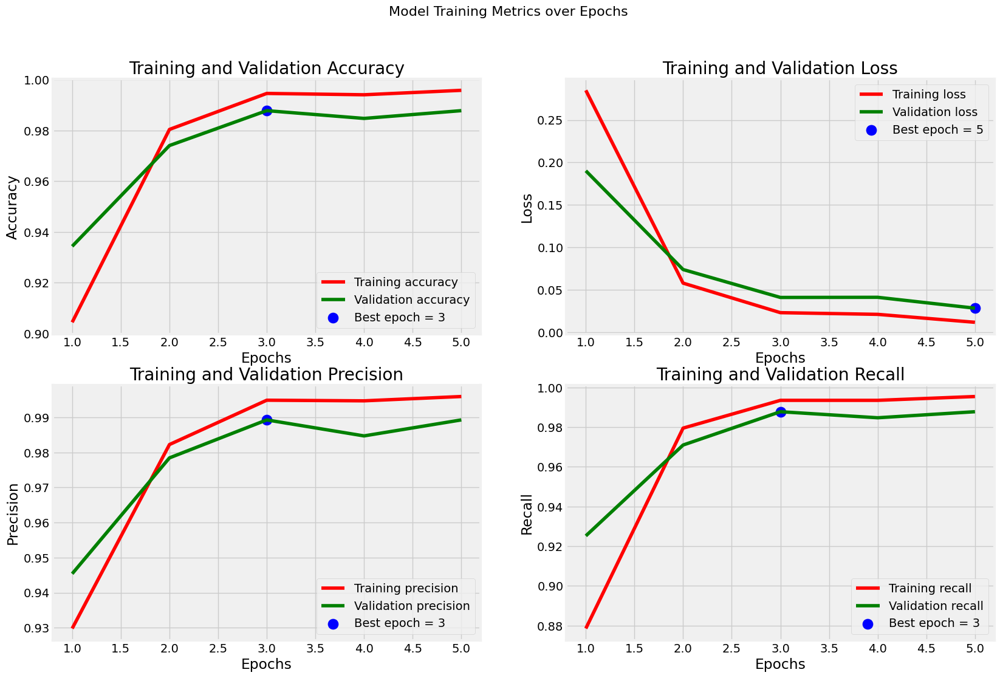

In [ ]:
# Get training and validation metrics from history
metrics = ['accuracy', 'loss', 'precision', 'recall']
tr_metrics = {m: hist.history[m] for m in metrics}
val_metrics = {m: hist.history[f'val_{m}'] for m in metrics}

# Find best epochs and values
best_epochs = {}
best_values = {}
for m in metrics:
  if m == 'loss':
      idx = np.argmin(val_metrics[m])
  else:
      idx = np.argmax(val_metrics[m])
  best_epochs[m] = idx + 1
  best_values[m] = val_metrics[m][idx]

# Plot metrics
plt.figure(figsize=(20, 12))
plt.style.use('fivethirtyeight')

for i,metric in enumerate(metrics, 1):
    plt.subplot(2, 2, i)
    epochs = range(1, len(tr_metrics[metric]) + 1)

    plt.plot(epochs, tr_metrics[metric], 'r', label=f'Training {metric}')
    plt.plot(epochs, val_metrics[metric], 'g', label=f'Validation {metric}')
    plt.scatter(best_epochs[metric], best_values[metric], s=150, c='blue',
                label=f'Best epoch = {best_epochs[metric]}')

    plt.title(f'Training and Validation {metric.title()}')
    plt.xlabel('Epochs')
    plt.ylabel(metric.title())
    plt.legend()
    plt.grid(True)

plt.suptitle('Model Training Metrics over Epochs', fontsize=16)
plt.show()

In [ ]:
train_score = model.evaluate(tr_gen, verbose=1)
valid_score = model.evaluate(valid_gen, verbose=1)
test_score = model.evaluate(ts_gen, verbose=1)

print(f"Train Accuracy: {train_score[1]*100:.2f}%")
print(f"Train Loss: {train_score[0]:.4f}")
print(f"\n\nValidation Accuracy: {valid_score[1]*100:.2f}%")
print(f"Validation Loss: {valid_score[0]:.4f}")
print(f"\n\nTest Accuracy: {test_score[1]*100:.2f}%")
print(f"Test Loss: {test_score[0]:.4f}")

179/179 ━━━━━━━━━━━━━━━━━━━━ 44s 245ms/step - accuracy: 0.9985 - loss: 0.0024 - precision: 0.9985 - recall: 0.9985
21/21 ━━━━━━━━━━━━━━━━━━━━ 6s 278ms/step - accuracy: 0.9904 - loss: 0.0281 - precision: 0.9906 - recall: 0.9904


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 217ms/step - accuracy: 0.9919 - loss: 0.0209 - precision: 0.9919 - recall: 0.9919
Train Accuracy: 99.86%
Train Loss: 0.0030


Validation Accuracy: 98.63%
Validation Loss: 0.0364


Test Accuracy: 99.09%
Test Loss: 0.0237


21/21 ━━━━━━━━━━━━━━━━━━━━ 9s 313ms/step


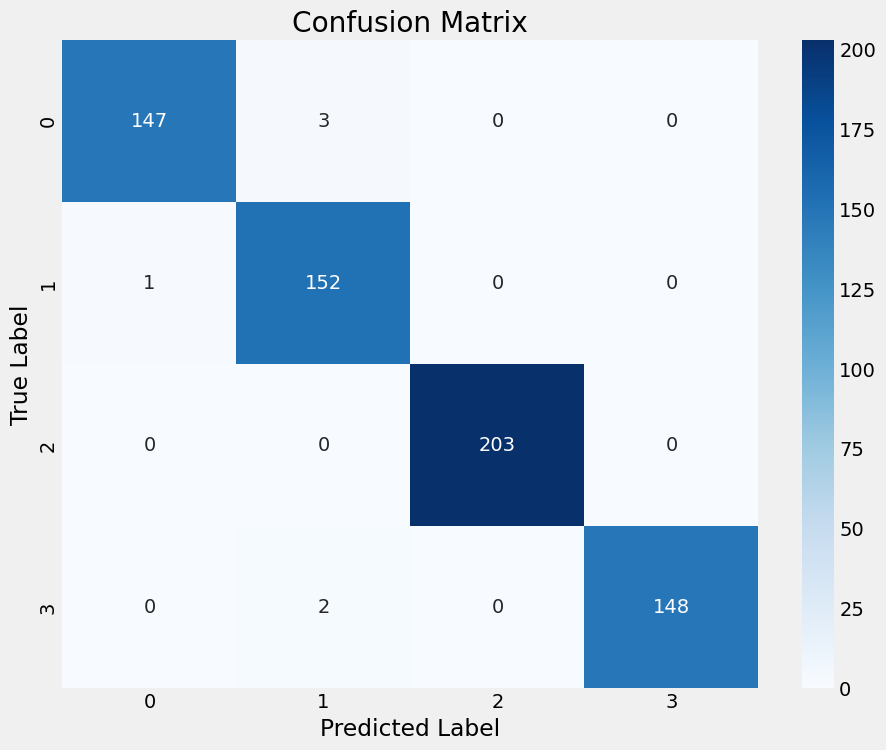

In [ ]:
preds = model.predict(ts_gen)
y_pred = np.argmax(preds, axis=1)

class_dict = {
    0: 'glioma',
    1: 'meningioma',
    2: 'no_tumor',
    3: 'pituitary'
}

# Then create and display the confusion matrix
cm = confusion_matrix(ts_gen.classes, y_pred)
labels = list(class_dict.keys())

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
from PIL import Image

def predict(img_path: str) -> None:
    # Get class labels
    labels = list(class_dict.keys())

    # Create figure
    plt.figure(figsize=(6, 8))

    # Load and preprocess image
    img = Image.open(img_path)
    resized_img = img.resize((299, 299))
    img_array = np.asarray(resized_img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0

    # Get model predictions
    predictions = model.predict(img_array)
    probabilities = list(predictions[0])

    # Get predicted class
    predicted_class_idx = np.argmax(probabilities)
    predicted_class = class_dict[predicted_class_idx]

    # Plot original image
    plt.subplot(2, 1, 1)
    plt.imshow(resized_img)
    plt.title(f"Input MRI Image\nPredicted: {predicted_class}")

    # Plot prediction probabilities
    plt.subplot(2, 1, 2)
    bars = plt.barh(labels, probabilities)
    plt.xlabel("Probability", fontsize=15)
    plt.title("Class Probabilities")

    # Add probability labels to bars
    ax = plt.gca()
    ax.bar_label(bars, fmt="%.2f")

    plt.tight_layout()
    plt.show()

    print(f"\nPredicted tumor type: {predicted_class}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


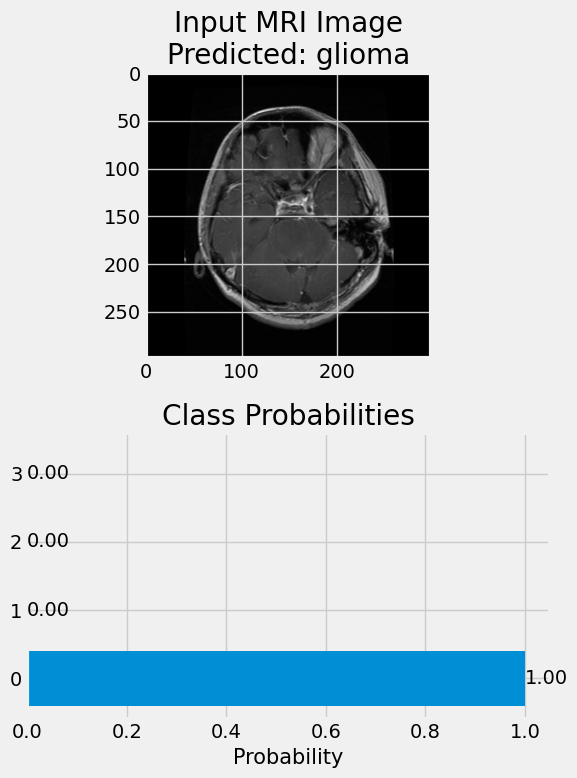


Predicted tumor type: glioma


In [ ]:
predict("/content/Testing/glioma/Te-gl_0010.jpg")

In [ ]:
model.save_weights("xception_model.weights.h5")

# Custom CNN Model

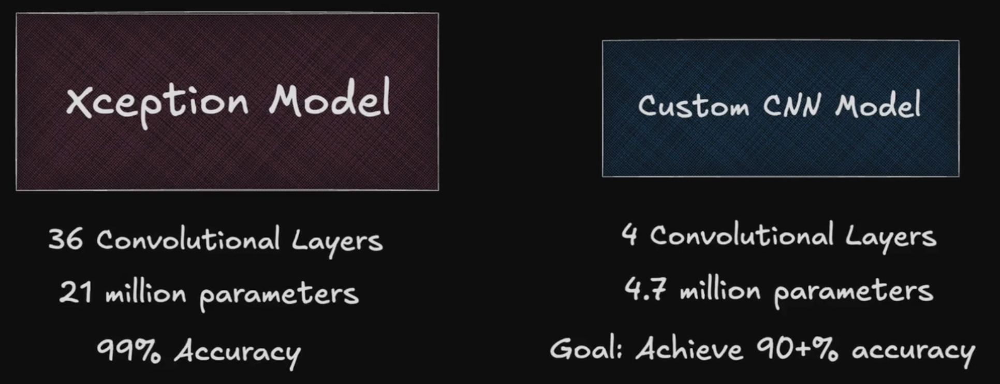

In [ ]:
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras import regularizers


batch_size = 16 # Adjust Batch Size to 16, 32, 64, 128

# Resize all images to consistent dimensions
img_size = (224, 224)

# Preprocess images by rescaling pixel values and adjusting their brightness randomly to make the model robust and generalized
image_generator = ImageDataGenerator(rescale=1/255, brightness_range=(0.8, 1.2))


tr_gen = image_generator.flow_from_dataframe(tr_df, x_col='Class Path', y_col='Class', batch_size=batch_size, target_size=img_size)

valid_gen = image_generator.flow_from_dataframe(valid_df, x_col='Class Path', y_col='Class', batch_size=batch_size, target_size=img_size)

ts_gen = image_generator.flow_from_dataframe(ts_df, x_col='Class Path', y_col='Class', batch_size=batch_size, target_size=img_size, shuffle=False)



# Create a sequential model

cnn_model = Sequential()

# Convolutional Layers
cnn_model.add(Conv2D(512, (3, 3), padding='same', input_shape=(224,224,3), activation='relu'))
cnn_model.add(MaxPooling2D(pool_size=(2, 2)))

cnn_model.add(Conv2D(256, (3, 3), padding='same', activation='relu'))
cnn_model.add(MaxPooling2D(pool_size=(2, 2)))
cnn_model.add(Dropout(0.25))

cnn_model.add(Conv2D(128, (3, 3), padding='same', activation='relu'))
cnn_model.add(MaxPooling2D(pool_size=(2, 2)))
cnn_model.add(Dropout(0.25))

cnn_model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
cnn_model.add(BatchNormalization())
cnn_model.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten the output for fully connected layers
cnn_model.add(Flatten())

# Fully connected layers
cnn_model.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
cnn_model.add(BatchNormalization())
cnn_model.add(Dropout(0.35))

cnn_model.add(Dense(4, activation='softmax'))   # Output layer with 4 neurons for the 4 classes

# Compile the model
cnn_model.compile(Adamax(learning_rate = 0.001), loss='categorical_crossentropy', metrics= ['accuracy', Precision(), Recall()])

# Display the model summary
cnn_model.summary()

Found 5712 validated image filenames belonging to 4 classes.
Found 655 validated image filenames belonging to 4 classes.
Found 656 validated image filenames belonging to 4 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 224, 224, 512)       │          14,336 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 512)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 112, 112, 256)       │       1,179,904 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 56, 56, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 56, 56, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 56, 56, 128)         │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 28, 28, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 28, 28, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 12544)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │       3,211,520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 4)                   │           1,028 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,776,900 (18.22 MB)

 Trainable params: 4,776,260 (18.22 MB)

 Non-trainable params: 640 (2.50 KB)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [ ]:
history = cnn_model.fit(tr_gen, epochs=10, validation_data=valid_gen, callbacks=[early_stopping])

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


357/357 ━━━━━━━━━━━━━━━━━━━━ 149s 342ms/step - accuracy: 0.6530 - loss: 4.9160 - precision: 0.6920 - recall: 0.5876 - val_accuracy: 0.6137 - val_loss: 3.3523 - val_precision: 0.6715 - val_recall: 0.5710
Epoch 2/10
357/357 ━━━━━━━━━━━━━━━━━━━━ 107s 298ms/step - accuracy: 0.7564 - loss: 2.7650 - precision: 0.7898 - recall: 0.7037 - val_accuracy: 0.4947 - val_loss: 5.0307 - val_precision: 0.5066 - val_recall: 0.4672
Epoch 3/10
357/357 ━━━━━━━━━━━━━━━━━━━━ 142s 300ms/step - accuracy: 0.8147 - loss: 1.9163 - precision: 0.8408 - recall: 0.7826 - val_accuracy: 0.5802 - val_loss: 4.8908 - val_precision: 0.5845 - val_recall: 0.5542
Epoch 4/10
357/357 ━━━━━━━━━━━━━━━━━━━━ 139s 292ms/step - accuracy: 0.8439 - loss: 1.4285 - precision: 0.8651 - recall: 0.8211 - val_accuracy: 0.7008 - val_loss: 1.7916 - val_precision: 0.7197 - val_recall: 0.6901
Epoch 5/10
357/357 ━━━━━━━━━━━━━━━━━━━━ 145s 299ms/step - accuracy: 0.8665 - loss: 1.1267 - precision: 0.8823 - recall: 0.8496 - val_accuracy: 0.8748 - val

In [ ]:
print(history.history)

NameError: name 'history' is not defined

In [ ]:
# Import necessary libraries
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization, Dropout, Flatten, Dense
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50

batch_size = 32
img_size = (224, 224)

# Data Augmentation
image_generator = ImageDataGenerator(
    rescale=1/255,
    brightness_range=(0.8, 1.2),
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=[0.5, 1.5]
)

tr_gen = image_generator.flow_from_dataframe(tr_df, x_col='Class Path', y_col='Class', batch_size=batch_size, target_size=img_size)
valid_gen = image_generator.flow_from_dataframe(valid_df, x_col='Class Path', y_col='Class', batch_size=batch_size, target_size=img_size)
ts_gen = image_generator.flow_from_dataframe(ts_df, x_col='Class Path', y_col='Class', batch_size=batch_size, target_size=img_size, shuffle=False)

# Create a sequential model
from tensorflow.keras.models import Sequential
cnn_model = Sequential()

# Convolutional Layers
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
cnn_model.add(base_model)
cnn_model.add(MaxPooling2D(pool_size=(2, 2)))
cnn_model.add(Flatten())

# Fully connected layers
cnn_model.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
cnn_model.add(BatchNormalization())
cnn_model.add(Dropout(0.25))

cnn_model.add(Dense(4, activation='softmax'))   # Output layer with 4 neurons for the 4 classes

# Compile the model
optimizer = Adamax(learning_rate=0.0001)
cnn_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Learning Rate Scheduler and Early Stopping
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.00001)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, min_delta=0.001)

# Train the model
history = cnn_model.fit(tr_gen, epochs=15, validation_data=valid_gen, callbacks=[lr_scheduler, early_stopping])

Found 5712 validated image filenames belonging to 4 classes.
Found 655 validated image filenames belonging to 4 classes.
Found 656 validated image filenames belonging to 4 classes.
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


179/179 ━━━━━━━━━━━━━━━━━━━━ 204s 796ms/step - accuracy: 0.7302 - loss: 5.7401 - val_accuracy: 0.2076 - val_loss: 6.6994 - learning_rate: 1.0000e-04
Epoch 2/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 133s 583ms/step - accuracy: 0.8633 - loss: 5.1854 - val_accuracy: 0.2427 - val_loss: 7.2916 - learning_rate: 1.0000e-04
Epoch 3/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 108s 589ms/step - accuracy: 0.8988 - loss: 4.9362 - val_accuracy: 0.3298 - val_loss: 7.2513 - learning_rate: 1.0000e-04
Epoch 4/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 141s 585ms/step - accuracy: 0.9139 - loss: 4.7460 - val_accuracy: 0.3573 - val_loss: 7.5714 - learning_rate: 1.0000e-04
Epoch 5/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 108s 585ms/step - accuracy: 0.9312 - loss: 4.5376 - val_accuracy: 0.5450 - val_loss: 6.1436 - learning_rate: 1.0000e-04
Epoch 6/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 140s 576ms/step - accuracy: 0.9421 - loss: 4.3400 - val_accuracy: 0.6855 - val_loss: 5.1692 - learning_rate: 1.0000e-04
Epoch 7/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 107s 580ms/

In [ ]:
! pip install groq

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 109.1/109.1 kB 4.4 MB/s eta 0:00:00


In [ ]:
from groq import Groq
from google.colab import userdata


groq_client = Groq(api_key=userdata.get('GROQ_API_KEY'))

In [ ]:
history_dict = str(history.history)

prompt = f"""
    You are an expert Data Scientist specializing in medical imaging analysis, particularly experienced with deep learning architectures for brain tumor classification from MRI scans. Given the current CNN_MODEL_CODE and its TRAINING_HISTORY, propose comprehensive improvements to enhance model performance and accuracy.

    <CNN_MODEL_CODE>
    # Import necessary libraries
      from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization, Dropout, Flatten, Dense
      from tensorflow.keras import regularizers
      from tensorflow.keras.optimizers import Adamax
      from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
      from tensorflow.keras.preprocessing.image import ImageDataGenerator
      from tensorflow.keras.applications import ResNet50

      batch_size = 32
      img_size = (224, 224)

      # Data Augmentation
      image_generator = ImageDataGenerator(
          rescale=1/255,
          brightness_range=(0.8, 1.2),
          rotation_range=20,
          width_shift_range=0.1,
          height_shift_range=0.1,
          horizontal_flip=True,
          zoom_range=[0.5, 1.5]
      )

      tr_gen = image_generator.flow_from_dataframe(tr_df, x_col='Class Path', y_col='Class', batch_size=batch_size, target_size=img_size)
      valid_gen = image_generator.flow_from_dataframe(valid_df, x_col='Class Path', y_col='Class', batch_size=batch_size, target_size=img_size)
      ts_gen = image_generator.flow_from_dataframe(ts_df, x_col='Class Path', y_col='Class', batch_size=batch_size, target_size=img_size, shuffle=False)

      # Create a sequential model
      from tensorflow.keras.models import Sequential
      cnn_model = Sequential()

      # Convolutional Layers
      base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
      cnn_model.add(base_model)
      cnn_model.add(MaxPooling2D(pool_size=(2, 2)))
      cnn_model.add(Flatten())

      # Fully connected layers
      cnn_model.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
      cnn_model.add(BatchNormalization())
      cnn_model.add(Dropout(0.25))

      cnn_model.add(Dense(4, activation='softmax'))   # Output layer with 4 neurons for the 4 classes

      # Compile the model
      optimizer = Adamax(learning_rate=0.0001)
      cnn_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

      # Learning Rate Scheduler and Early Stopping
      lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.00001)
      early_stopping = EarlyStopping(monitor='val_loss', patience=10, min_delta=0.001)

      # Train the model
      history = cnn_model.fit(tr_gen, epochs=20, validation_data=valid_gen, callbacks=[lr_scheduler, early_stopping])
    </CNN_MODEL_CODE>

    <TRAINING_HISTORY>
     {history_dict}
    </TRAINING_HISTORY>

    Use a step by step approach for proposing code adjustments and changes
    Provide your response in valid JSON format, in the following schema:

    {{
        'reasoning': 'Detailed explanation about how to improve the CNN model and proposed changes',
        'code': 'Full adjusted python code with the implemented improvement and changes'
    }}
    """

response = groq_client.chat.completions.create(
    model="llama-3.3-70b-versatile",
    messages= [
        {
            "role": "user",
            "content": prompt
        }
    ],
    response_format={"type": "json_object"},
)

print(response.choices[0].message.content)

{
   "reasoning": "To improve the CNN model and enhance its performance, several adjustments can be made. Firstly, the learning rate can be adjusted to a smaller value to allow for more precise convergence. Additionally, the batch normalization and dropout rates can be fine-tuned to optimize the model's regularization. Furthermore, the use of pre-trained models such as ResNet50 can be leveraged to take advantage of transfer learning. The model can also benefit from data augmentation, including random rotation, width and height shifts, and horizontal flipping. Lastly, early stopping and learning rate reduction can be implemented to prevent overfitting and adapt to the model's convergence.",
   "code": "\n# Import necessary libraries\nfrom tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization, Dropout, Flatten, Dense\nfrom tensorflow.keras import regularizers\nfrom tensorflow.keras.optimizers import Adamax\nfrom tensorflow.keras.callbacks import ReduceLROnPlateau, Early

In [ ]:
import json

print(json.loads(response.choices[0].message.content)['code'])


# Import necessary libraries
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization, Dropout, Flatten, Dense
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50

batch_size = 32
img_size = (224, 224)

# Data Augmentation
image_generator = ImageDataGenerator(
    rescale=1/255,
    brightness_range=(0.8, 1.2),
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=[0.5, 1.5]
)

tr_gen = image_generator.flow_from_dataframe(tr_df, x_col='Class Path', y_col='Class', batch_size=batch_size, target_size=img_size)
valid_gen = image_generator.flow_from_dataframe(valid_df, x_col='Class Path', y_col='Class', batch_size=batch_size, target_size=img_size)
ts_gen = image_generator.flow_from_

In [ ]:
print(json.loads(response.choices[0].message.content)['reasoning'])

To improve the CNN model and enhance its performance, several adjustments can be made. Firstly, the learning rate can be adjusted to a smaller value to allow for more precise convergence. Additionally, the batch normalization and dropout rates can be fine-tuned to optimize the model's regularization. Furthermore, the use of pre-trained models such as ResNet50 can be leveraged to take advantage of transfer learning. The model can also benefit from data augmentation, including random rotation, width and height shifts, and horizontal flipping. Lastly, early stopping and learning rate reduction can be implemented to prevent overfitting and adapt to the model's convergence.


In [ ]:
# Get training and validation metrics from history
metrics = ['accuracy', 'loss', 'precision', 'recall']
tr_metrics = {m: history.history[m] for m in metrics}
val_metrics = {m: history.history[f'val_{m}'] for m in metrics}

# Find best epochs and values
best_epochs = {}
best_values = {}
for m in metrics:
  if m == 'loss':
      idx = np.argmin(val_metrics[m])
  else:
      idx = np.argmax(val_metrics[m])
  best_epochs[m] = idx + 1
  best_values[m] = val_metrics[m][idx]

# Plot metrics
plt.figure(figsize=(20, 12))
plt.style.use('fivethirtyeight')

for i,metric in enumerate(metrics, 1):
    plt.subplot(2, 2, i)
    epochs = range(1, len(tr_metrics[metric]) + 1)

    plt.plot(epochs, tr_metrics[metric], 'r', label=f'Training {metric}')
    plt.plot(epochs, val_metrics[metric], 'g', label=f'Validation {metric}')
    plt.scatter(best_epochs[metric], best_values[metric], s=150, c='blue',
                label=f'Best epoch = {best_epochs[metric]}')

    plt.title(f'Training and Validation {metric.title()}')
    plt.xlabel('Epochs')
    plt.ylabel(metric.title())
    plt.legend()
    plt.grid(True)

plt.suptitle('Model Training Metrics over Epochs', fontsize=16)
plt.show()

KeyError: 'precision'

In [ ]:
train_score = cnn_model.evaluate(tr_gen, verbose=1)
valid_score = cnn_model.evaluate(valid_gen, verbose=1)
test_score = cnn_model.evaluate(ts_gen, verbose=1)

print(f"Train Accuracy: {train_score[1]*100:.2f}%")
print(f"Train Loss: {train_score[0]:.4f}")
print(f"\n\nValidation Accuracy: {valid_score[1]*100:.2f}%")
print(f"Validation Loss: {valid_score[0]:.4f}")
print(f"\n\nTest Accuracy: {test_score[1]*100:.2f}%")
print(f"Test Loss: {test_score[0]:.4f}")

NameError: name 'cnn_model' is not defined

21/21 ━━━━━━━━━━━━━━━━━━━━ 10s 466ms/step


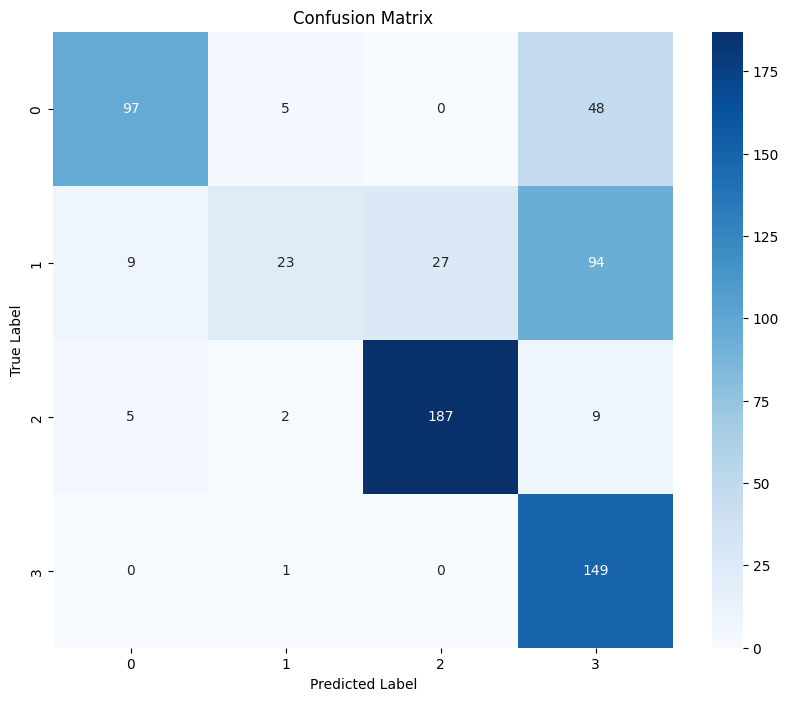

In [ ]:
preds = cnn_model.predict(ts_gen)
y_pred = np.argmax(preds, axis=1)

class_dict = {
    0: 'glioma',
    1: 'meningioma',
    2: 'no_tumor',
    3: 'pituitary'
}

# Then create and display the confusion matrix
cm = confusion_matrix(ts_gen.classes, y_pred)
labels = list(class_dict.keys())

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
clr = classification_report(ts_gen.classes, y_pred)
print(clr)

              precision    recall  f1-score   support

           0       0.87      0.65      0.74       150
           1       0.74      0.15      0.25       153
           2       0.87      0.92      0.90       203
           3       0.50      0.99      0.66       150

    accuracy                           0.70       656
   macro avg       0.75      0.68      0.64       656
weighted avg       0.76      0.70      0.66       656



In [ ]:
predict("/content/Testing/glioma/Te-gl_0010.jpg")

In [ ]:
cnn_model.save_weights("resnet_model.weights.h5")

In [ ]:
cnn_model.save("cnn_model.h5")

# Part 2: Streamlit Web App

In [ ]:
! pip install streamlit pyngrok python-dotenv

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.1/9.1 MB 49.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 65.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 8.5 MB/s eta 0:00:00


In [ ]:
from threading import Thread
from pyngrok import ngrok
from google.colab import userdata

In [ ]:
ngrok_token = userdata.get('NGROK_AUTH_TOKEN')

ngrok.set_auth_token(ngrok_token)

In [ ]:
def run_streamlit():
    os.system("streamlit run /content/app.py --server.port 8501")

In [ ]:
%%writefile app.py

import streamlit as st
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import numpy as np
import plotly.graph_objects as go
import cv2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.metrics import Precision, Recall
import google.generativeai as genai
from google.colab import userdata
import PIL.Image
import os
from google.colab import userdata
from dotenv import load_dotenv

load_dotenv()

genai.configure(api_key=os.getenv("GEMINI_API_KEY"))

output_dir = 'saliency_maps'
os.makedirs(output_dir, exist_ok=True)


def generate_explanation(img_path, model_prediction, confidence):

    prompt = f"""You are an expert neuroscientist. You are tasked with explaining a saliency map of a brain tumor MRI scan.
    The saliency map was generated by a deep learning model that was trained to classify brain tumors
    as either glioma, meningioma, pituitary, or no tumor.

    The saliency map highlights the regions of the image that the machine learning model is focusing on to to make the prediction.

    The deep learning model predicted the image to be of class '{model_prediction}' with a confidence of {confidence * 100}%.

    In your response:
    - Explain what regions of the brain the model is focusing on, based on the saliency map. Refer to the regions highlighted
    in light cyan, those are the regions where the model is focusing on.
    - Explain possible reasons why the model made the prediction it did.
    - Don't mention anything like 'The saliency map highlights the regions the model is focusing on, which are in light cyan'
    in your explanation.

    Let's think step by step about this. Verify step by step.
    """

    img = PIL.Image.open(img_path)

    model = genai.GenerativeModel(model_name="gemini-2.0-flash-exp")
    response = model.generate_content([prompt, img])

    return response.text



def generate_saliency_map(model, img_array, class_index, img_size):
    with tf.GradientTape() as tape:
        img_tensor = tf.convert_to_tensor(img_array)
        tape.watch(img_tensor)
        predictions = model(img_tensor)
        target_class = predictions[:, class_index]

    gradients = tape.gradient(target_class, img_tensor)
    gradients = tf.math.abs(gradients)
    gradients = tf.reduce_max(gradients, axis=-1)
    gradients = gradients.numpy().squeeze()

    # Resize gradients to match original image size
    gradients = cv2.resize(gradients, img_size)

    # Create a circular mask for the brain area
    center = (gradients.shape[0] // 2, gradients.shape[1] // 2)
    radius = min(center[0], center[1]) - 10
    y, x = np.ogrid[:gradients.shape[0], :gradients.shape[1]]
    mask = (x - center[0])**2 + (y - center[1])**2 <= radius**2

    # Apply mask to gradients
    gradients = gradients * mask

    # Normalize only the brain area
    brain_gradients = gradients[mask]
    if brain_gradients.max() > brain_gradients.min():
        brain_gradients = (brain_gradients - brain_gradients.min()) / (brain_gradients.max() - brain_gradients.min())
    gradients[mask] = brain_gradients

    # Apply a higher threshold
    threshold = np.percentile(gradients[mask], 80)
    gradients[gradients < threshold] = 0

    # Apply more aggressive smoothing
    gradients = cv2.GaussianBlur(gradients, (11, 11), 0)

    # Create a heatmap overlay with enhanced contrast
    heatmap = cv2.applyColorMap(np.uint8(255 * gradients), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    # Resize heatmap to match original image size
    heatmap = cv2.resize(heatmap, img_size)

    # Superimpose the heatmap on original image with increased opacity
    original_img = image.img_to_array(img)
    superimposed_img = heatmap * 0.7 + original_image * 0.3
    superimposed_img = superimposed_img.astype(np.uint8)

    img_path = os.path.join(output_dir, uploaded_file.name)
    with open(img_path, "wb") as f:
        f.write(uploaded_file.getbuffer())

    saliency_map_path = f'saliency_maps/{uploaded_file.name}'

    # Save the saliency map
    cv2.imwrite(saliency_map_path, cv2.cvtColor(superimposed_img, cv2.COLOR_RGB2BGR))

    return superimposed_img




def load_xception_model(model_path):
    img_shape(299, 299, 3)
    base_model = tf.keras.applications.Xception(include_top=False, weights="imagenet", input_shape=img_shape, pooling='max')

    model = Sequential([
        base_model,
        Flatten(),
        Dropout(rate=0.3),
        Dense(128, activation='relu'),
        Dropout(rate=0.25),
        Dense(4, activation='softmax')
    ])

    model.build((None,) + img_shape)

    # Compile the model
    model.compile(Adamax(learning_rate=0.001),
                  loss='categorical_crossentropy',
                  metrics=[['accuracy', Precision(), Recall()]])

    model.load_weights(model_path)

    return model


st.title("Brain Tumor Classification")

st.write("Upload an image of a brain MRI scan to classify.")

uploaded_file = st.file_uploader("Choose an image...", type=["jpg", "jpeg", "png"])

if uploaded_file is not None:

    selected_model = st.radio(
        "Select Model",
        ("Transfer Learning - Xception", "Custom CNN")
    )

    if selected_model == "Transfer Learning - Xception":
        model = load_xception_model('/content/xception_model.weights.h5')
        img_size = (299, 299)

    else:
        model = load_model('/content/cnn_model.h5')
        img_size = (224, 224)


    labels = ['Glioma', 'Meningioma', 'No tumor', 'Pituitary']
    img = image.load_img(uploaded_file, target_size=img_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0

    prediction = model.predict(img_array)

    # Get the class with the highest probability
    class_index = np.argmax(prediction[0])
    result = labels[class_index]

    st.write(f"Predicted Class: {result}")
    st.write("Predictions:")
    for label, prob in zip(labels, prediction[0]):
        st.write(f"{label}: {prob:.4f}")


    saliency_map = generate_saliency_map(model, img_array, class_index, img_size)

    col1, col2 = st.columns(2)
    with col1:
        st.image(uploaded_file, caption='Uploaded Image', use_column_width=True)
    with col2:
        st.image(saliency_map, caption='Saliency Map', use_column_width=True)


    saliency_map_path = f'saliency_maps/{uploaded_file.name}'
    explanation = generate_explanation(saliency_map_path, result, prediction[0][class_index])

    st.write("## Explanation")
    st.write(explanation)

Writing app.py


In [ ]:
thread = Thread(target=run_streamlit)
thread.start()

Exception in thread Thread-10 (run_streamlit):
Traceback (most recent call last):
  File "/usr/lib/python3.10/threading.py", line 1016, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.10/threading.py", line 953, in run
    self._target(*self._args, **self._kwargs)
  File "<ipython-input-6-a0e779c7be9a>", line 2, in run_streamlit
NameError: name 'os' is not defined


In [ ]:
public_url = ngrok.connect(addr='8501', proto='http', bind_tls=True)

print("Public URL:", public_url)

Public URL: NgrokTunnel: "https://1d27-34-106-151-69.ngrok-free.app" -> "http://localhost:8501"


In [ ]:
tunnels = ngrok.get_tunnels()
for tunnel in tunnels:
    print(f"Closing tunnel: {tunnel.public_url} -> {tunnel.config['addr']}")
    ngrok.disconnect(tunnel.public_url)

Closing tunnel: https://1d27-34-106-151-69.ngrok-free.app -> http://localhost:8501


In [ ]:
%%writefile .env

GEMINI_API_KEY = ""

Writing .env
